In [1]:
import os, sys
sys.path.append(os.path.dirname(os.getcwd()))
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))

from glob import glob
import math
from pprint import pprint
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import time
import json
import random
import pandas as pd
from tqdm import tqdm
import trimesh

import torch

from ANALYSIS.analysis_utils import (
    plot_panel_info,
    visualize_meshes_plotly,
    filter_segmentation_map,
    filter_segmentation_map_clusters,
    is_clockwise,
)

from env_constants import SEWFORMER_PROJ_ROOT, DATASET_ROOT, PYGARMENT_ROOT

sys.path.append(PYGARMENT_ROOT)

import pygarment as pyg

In [2]:
garment_df = pd.read_csv("garment_df_20250215_165422.csv")

filtered_combination_name_list = np.unique(garment_df[
    garment_df["mesh_filter_failed"] == False
]["matching_combination_name"]).tolist()

filtered_combination_path_list = list(map(
    lambda x : os.path.join(DATASET_ROOT, 'sewfactory', x),
    filtered_combination_name_list
))

In [3]:
# for combination_path in filtered_combination_path_list :
#     spec_config_path = os.path.join(combination_path, "static", "spec_config.json")
#     with open(spec_config_path, "r") as f:
#         spec_config = json.load(open(spec_config_path, "r"))

#     garment_name_list = list(map(
#         lambda x : os.path.basename(x["spec"].replace("\\", "/")),
#         spec_config.values()
#     ))
    
#     for garment_name in garment_name_list :
#         mesh = trimesh.load_mesh(os.path.join(
#             combination_path, "static", f"{garment_name}_{garment_name}.obj",
#         ), process=False)

#         with open(
#             os.path.join(
#                 combination_path, "static", f"{garment_name}_{garment_name}_segmentation_filtered.txt"
#             ),
#             "r"
#         ) as f:
#             mesh_segmentation_list = list(map(
#                 lambda x : x.strip(),
#                 f.readlines()
#             ))
        

In [3]:
import json
import numpy as np
import smplx
import torch
import trimesh

SMPLH_PATH = os.path.join(
    SEWFORMER_PROJ_ROOT, "Sewformer", "assets",
)

# Create SMPL-H model
model = smplx.create(
    model_path=SMPLH_PATH,
    model_type='smplh',  # Specifically use SMPL-H
    ext='pkl',
    gender='female',
    use_pca=False,  # Important: disable PCA for hand poses
    batch_size=1,
)

In [4]:

def separate_consecutive_sequences(boundary_vertices):
    """
    Splits the boundary vertices into separate consecutive groups.

    Args:
        boundary_vertices (np.array): Array of boundary vertex indices.

    Returns:
        list of np.array: List containing separate consecutive vertex groups.
    """
    # Ensure the array is sorted
    boundary_vertices = np.sort(boundary_vertices)

    # Find the indices where the difference is greater than 1 (i.e., gaps)
    split_indices = np.where(np.diff(boundary_vertices) > 1)[0] + 1

    # Split the array at those indices
    consecutive_groups = np.split(boundary_vertices, split_indices)

    return consecutive_groups


def find_boundary_vertices(mesh):
    """
    Identifies boundary vertices in a manifold mesh.
    
    - Boundary edges are edges that belong to only one face.
    - Boundary vertices are the endpoints of boundary edges.
    
    Args:
        mesh (trimesh.Trimesh): The input mesh object.
    
    Returns:
        np.array: Indices of boundary vertices.
    """
    # Step 1: Find all edges in the mesh
    edges, counts = np.unique(np.sort(mesh.edges, axis=1), axis=0, return_counts=True)

    # Step 2: Select edges that belong to only one face (boundary edges)
    boundary_edges = edges[counts == 1]

    # Step 3: Extract boundary vertex indices
    boundary_vertices = np.unique(boundary_edges)

    return boundary_vertices

In [5]:
import numpy as np
from collections import defaultdict

In [15]:

IDX = 1551

IDX = random.randint(0, len(filtered_combination_path_list) - 1)
combination_path = filtered_combination_path_list[IDX]

print(IDX)
print(combination_path)

spec_config_path = os.path.join(combination_path, "static", "spec_config.json")
with open(spec_config_path, "r") as f:
    spec_config = json.load(open(spec_config_path, "r"))

garment_name_list = list(map(
    lambda x : os.path.basename(x["spec"].replace("\\", "/")),
    spec_config.values()
))



with open(os.path.join(combination_path, "static", "static__body_info.json"), "r") as f:
    static_body_data = json.load(f)
    betas = torch.tensor(static_body_data['shape'], dtype=torch.float32).unsqueeze(0)
    pose = torch.tensor(
        np.deg2rad(static_body_data['pose']),
        dtype=torch.float32
    ).unsqueeze(0)  # Shape: (1, 52, 3)
    transl = torch.tensor(static_body_data['trans'], dtype=torch.float32).unsqueeze(0)

    body_pose = pose[0, 1:22].reshape(1, -1)  # Body joints (excluding global orientation)
    left_hand_pose = pose[0, 22:37].reshape(1, -1)  # Left hand joints
    right_hand_pose = pose[0, 37:52].reshape(1, -1)  # Right hand joints
    global_orient = pose[0, 0].unsqueeze(0)  # Global orientation

    # Get body mesh
    output = model(
        betas=betas,
        body_pose=body_pose,
        global_orient=global_orient,
        left_hand_pose=left_hand_pose,
        right_hand_pose=right_hand_pose,
        # transl=transl
    )
    vertices = output.vertices.detach().numpy()[0]
    faces = model.faces

    # SCALE = 2 * transl.numpy()[0, 1] / (vertices[:, 1].max() - vertices[:, 1].min())
    SCALE = 100
    Z_OFFSET = -3
    Y_OFFSET = 21

    static_body_mesh = trimesh.Trimesh(vertices=vertices, faces=faces)
    static_body_mesh.apply_scale(SCALE)

    static_body_mesh.vertices += transl.numpy()
    # static_body_mesh.vertices[:, 1] -= static_body_mesh.vertices[:, 1].min()
    static_body_mesh.vertices[:, 2] += Z_OFFSET
    static_body_mesh.vertices[:, 1] += Y_OFFSET


mesh_dict = {}
garment_dict = {}
for garment_name in garment_name_list :
    spec_file_path = os.path.join(
        combination_path, "static", f"{garment_name}_specification.json"
    )
    pattern = pyg.pattern.wrappers.VisPattern(spec_file_path)
    drawn_pattern_list = list(map(
        lambda pannel_name : pattern._draw_a_panel(
            pannel_name, apply_transform=False, fill=True
        ),
        pattern.panel_order()
    ))
    panel_svg_path_dict = {
        panel_name : pattern._draw_a_panel(
            panel_name, apply_transform=False, fill=True
        )
        for panel_name in pattern.panel_order()
    }

    stitch_dict = {
        i : v for i, v in enumerate(pattern.pattern['stitches'])
    }
    
    mesh = trimesh.load_mesh(os.path.join(
        combination_path, "static", f"{garment_name}_{garment_name}.obj",
    ), process=False)

    neighbor_idx_list = mesh.vertex_neighbors
    
    with open(
        os.path.join(
            combination_path, "static", f"{garment_name}_{garment_name}_segmentation_filtered.txt"
        ),
        "r"
    ) as f:
        mesh_segmentation_list = list(map(
            lambda x : x.strip(),
            f.readlines()
        ))
        vertex_mask_dict = {}
        for panel_name in panel_svg_path_dict.keys() :
            vertex_mask_dict[panel_name] = np.array(list(map(
                lambda x : x == panel_name,
                mesh_segmentation_list
            )))
    rounded_vertices = np.round(mesh.vertices, decimals=6)  # Round to avoid floating point precision errors
    unique_vertices, inverse_indices, counts = np.unique(
        rounded_vertices, axis=0, return_inverse=True, return_counts=True
    )
    overlapping_vertex_indices = np.where(counts > 1)[0]  # Indices of unique vertices appearing more than once
    vertex_to_unique = inverse_indices  # Maps each vertex in mesh.vertices to unique_vertices index
    vertex_segmentation_map = defaultdict(set)

    for i, segm in enumerate(mesh_segmentation_list):
        unique_idx = vertex_to_unique[i]
        vertex_segmentation_map[unique_idx].add(segm)  # Collect segmentation labels for each unique vertex
    stitch_vertex_mask = np.zeros(len(mesh.vertices), dtype=bool)

    for vert_idx, segmentations in vertex_segmentation_map.items():
        if len(segmentations) > 1:  # If a vertex belongs to multiple panels, it’s a stitch
            stitch_vertex_mask[vertex_to_unique == vert_idx] = True  # Mark all duplicate instances

    # Step 6: Update segmentation list
    new_segmentation_list = mesh_segmentation_list.copy()
    for i in range(len(mesh_segmentation_list)):
        if stitch_vertex_mask[i]:
            new_segmentation_list[i] = "stitch"  # Assign the stitch label

    print(f"Identified {np.sum(stitch_vertex_mask)} stitch vertices.")

    boundary_vertices = find_boundary_vertices(mesh)
    consecutive_groups = separate_consecutive_sequences(boundary_vertices)

    garment_dict[garment_name] = {
        "panel_svg_path_dict" : panel_svg_path_dict,
        "stitch_dict" : stitch_dict,
        "mesh" : mesh,
        "segmentation" : new_segmentation_list,
        "vertex_mask_dict" : vertex_mask_dict,
        "stitch_vertex_mask" : stitch_vertex_mask,
        "boundary_vertices" : boundary_vertices,
        "consecutive_groups" : consecutive_groups,
    }
fig = visualize_meshes_plotly(
    list(map(
        lambda x : x["mesh"],
        garment_dict.values()
    )),
    show_edges=False,
    vertices_list = list(map(
        lambda x : x["mesh"].vertices[
            x["stitch_vertex_mask"]
        ],
        garment_dict.values()
    )),
    vertices_color_list=[
        "red", "red", "red",
        # "blue", "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"
    ],
    show=False
)
fig.update_layout(
    scene = dict(
        xaxis = dict(visible=False),
        yaxis = dict(visible=False),
        zaxis = dict(visible=False),
        bgcolor='rgba(255,255,255,1)'  # transparent background
    ),
    paper_bgcolor='rgba(255,255,255,1)'  # transparent paper background
)
fig.show()

821
/Users/hjp/HJP/KUAICV/VTO/DATASET/sewfactory/sewfactory/tee_3CA4P8J68P_skirt_2_panels_KO04E2E1EG
Identified 512 stitch vertices.
Identified 168 stitch vertices.


In [7]:
garment_info = list(garment_dict.values())[0]

panel_svg_path_dict = garment_info["panel_svg_path_dict"]
stitch_dict = garment_info["stitch_dict"]
mesh = garment_info["mesh"]
segmentation = garment_info["segmentation"]
vertex_mask_dict = garment_info["vertex_mask_dict"]
stitch_vertex_mask = garment_info["stitch_vertex_mask"]
boundary_vertices = garment_info["boundary_vertices"]
consecutive_groups = garment_info["consecutive_groups"]


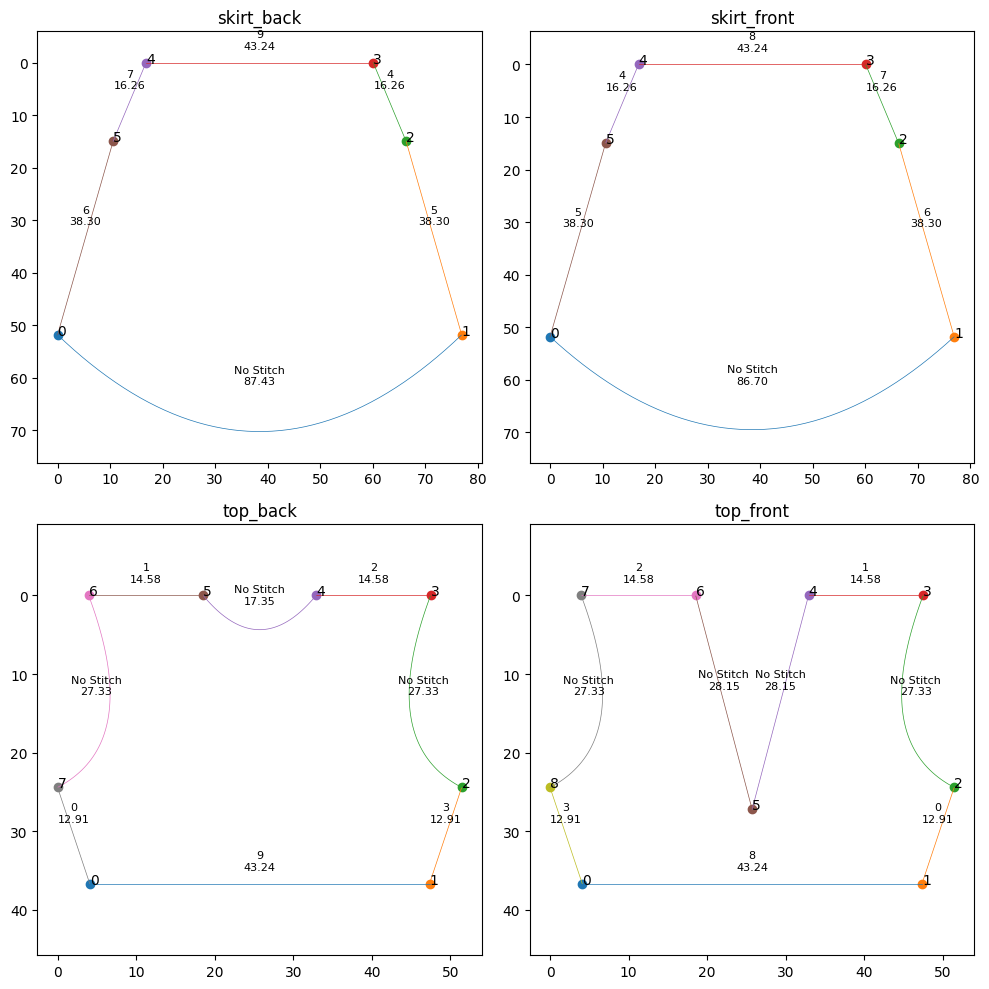

In [8]:
N_SAMPLE = 50

NCOLs = int(np.ceil(np.sqrt(len(panel_svg_path_dict))))
NROWS = int(np.ceil(len(panel_svg_path_dict) / NCOLs))
FIGLEN = 5

plt.figure(figsize=(FIGLEN * NCOLs, FIGLEN * NROWS))

for i, panel_name in enumerate(panel_svg_path_dict.keys()) :
    ax = plt.subplot(NROWS, NCOLs, i + 1)
    ax.set_title(panel_name)
    
    edges = list(panel_svg_path_dict[panel_name][0])
    for edge_idx, edge in enumerate(edges) :
        
        this_edge_stitch_idx = -1
        for stitch_idx, stitch_info in stitch_dict.items() :
            if (
                stitch_info[0]['edge'] == edge_idx and stitch_info[0]['panel'] == panel_name
            ) or (
                stitch_info[1]['edge'] == edge_idx and stitch_info[1]['panel'] == panel_name
            ):
                this_edge_stitch_idx = stitch_idx
                break
        stitch_name = f"{this_edge_stitch_idx}" if this_edge_stitch_idx != -1 else "No Stitch"
        
        edge_length = edge.length()
        
        t_arr = np.linspace(0, 1, N_SAMPLE)
        sampled_point_arr = np.array([
            [edge.point(t).real, edge.point(t).imag]
            for t in t_arr
        ])
        
        ax.scatter(
            [edge.start.real], [edge.start.imag],
        )
        
        ax.annotate(
            f"{stitch_name}\n{edge_length:.2f}",
            sampled_point_arr.mean(axis=0),
            textcoords="offset points",
            xytext=(0, 10),
            ha='center',
            fontsize = 8,
        )
        
        ax.plot(
            sampled_point_arr[:, 0], sampled_point_arr[:, 1],
            linewidth = 0.5
        )
        plt.annotate(
            f"{edge_idx}",
            (edge.start.real, edge.start.imag),
        )
        
    ax.invert_yaxis()
    ax.set_aspect("equal")
    ax.axis("equal")
        
    
plt.tight_layout()
plt.show()


In [9]:
stitch_vertex_mask

array([ True,  True, False, ..., False, False, False])

In [12]:
fig = visualize_meshes_plotly(
    [mesh],
    show_edges=False,
    vertices_list = [
        # mesh.vertices[np.where(stitch_vertex_mask)[0][:100]]
        mesh.vertices[consecutive_groups[0][:2]]
    ],
    vertices_color_list = ["red"],
    show = True
)


In [14]:
import numpy as np
import trimesh
import networkx as nx

def disassemble_mesh_to_panels(mesh):
    """
    Disassembles a garment mesh into separate panel meshes.
    
    Args:
        mesh (trimesh.Trimesh): The input garment mesh.

    Returns:
        list of trimesh.Trimesh: List of individual panel meshes.
    """
    # Step 1: Create a graph from the mesh connectivity
    mesh_graph = nx.Graph()

    # Add edges based on mesh faces (each face connects three vertices)
    for face in mesh.faces:
        mesh_graph.add_edge(face[0], face[1])
        mesh_graph.add_edge(face[1], face[2])
        mesh_graph.add_edge(face[2], face[0])

    # Step 2: Find connected components (each should be an individual panel)
    connected_components = list(nx.connected_components(mesh_graph))
    print(f"Found {len(connected_components)} separate panel meshes.")

    # Step 3: Extract panel sub-meshes
    panel_meshes = []
    for component in connected_components:
        panel_vertex_indices = np.array(list(component))  # Original indices
        
        # Step 3.1: Create a mapping from original to new local indices
        index_map = {old_idx: new_idx for new_idx, old_idx in enumerate(panel_vertex_indices)}

        # Step 3.2: Get faces that only use the panel's vertices
        face_mask = np.isin(mesh.faces, panel_vertex_indices).all(axis=1)
        panel_faces = mesh.faces[face_mask]

        # Step 3.3: Reindex faces to local vertex indices
        reindexed_faces = np.vectorize(index_map.get)(panel_faces)

        # Step 3.4: Create new mesh
        panel_mesh = trimesh.Trimesh(
            vertices=mesh.vertices[panel_vertex_indices],
            faces=reindexed_faces
        )
        panel_meshes.append(panel_mesh)

    return panel_meshes

# Example usage
panel_meshes = disassemble_mesh_to_panels(mesh)

# Visualize separated panel meshes
fig = visualize_meshes_plotly(
    panel_meshes,
    color_list=["red", "blue", "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"],
    show_edges=True, show=True
)

Found 4 separate panel meshes.


In [ ]:
# Disassemble seperated panels



In [26]:
# import numpy as np
# import networkx as nx
# import trimesh

# # Step 1: Create a graph of the mesh based on its connectivity
# mesh_graph = nx.Graph()

# # Add edges based on mesh faces (each face has three vertices)
# for face in mesh.faces:
#     mesh_graph.add_edge(face[0], face[1])
#     mesh_graph.add_edge(face[1], face[2])
#     mesh_graph.add_edge(face[2], face[0])

# # Step 2: Find connected components (disassemble panels)
# connected_components = list(nx.connected_components(mesh_graph))
# print(f"Number of separate panels: {len(connected_components)}")

# # Step 3: Extract boundary vertices for each panel
# boundary_vertices_per_panel = []
# panel_indices_list = []

# for panel_vertices in connected_components:
#     panel_vertices = np.array(list(panel_vertices))  # Convert to array
#     panel_indices_list.append(panel_vertices)
    
#     # Find boundary vertices within this panel
#     boundary_vertices = set()
    
#     for vert in panel_vertices:
#         neighbors = list(mesh_graph.neighbors(vert))
#         if any(neigh not in panel_vertices for neigh in neighbors):
#             boundary_vertices.add(vert)
    
#     boundary_vertices_per_panel.append(np.array(list(boundary_vertices)))

# print(f"Extracted boundary vertices for {len(boundary_vertices_per_panel)} panels.")

In [27]:
import numpy as np
import trimesh


boundary_vertices = find_boundary_vertices(mesh)
consecutive_groups = separate_consecutive_sequences(boundary_vertices)


# fig = visualize_meshes_plotly(
#     [mesh],
#     show_edges=False,
#     vertices_list = list(map(
#         lambda x : mesh.vertices[x],
#         consecutive_groups
#     )),
#     vertices_color_list = ["red", "blue", "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"],
#     show = True
# )

In [10]:
IDX = random.randint(0, len(filtered_combination_path_list) - 1)
combination_path = filtered_combination_path_list[IDX]

print(IDX)
print(combination_path)

spec_config_path = os.path.join(combination_path, "static", "spec_config.json")
with open(spec_config_path, "r") as f:
    spec_config = json.load(open(spec_config_path, "r"))

garment_name_list = list(map(
    lambda x : os.path.basename(x["spec"].replace("\\", "/")),
    spec_config.values()
))

mesh_dict = {}
for garment_name in garment_name_list :
    spec_file_path = os.path.join(
        combination_path, "static", f"{garment_name}_specification.json"
    )
    pattern = pyg.pattern.wrappers.VisPattern(spec_file_path)
    drawn_pattern_list = list(map(
        lambda pannel_name : pattern._draw_a_panel(
            pannel_name, apply_transform=False, fill=True
        ),
        pattern.panel_order()
    ))
    panel_svg_path_dict = {
        panel_name : pattern._draw_a_panel(
            panel_name, apply_transform=False, fill=True
        )
        for panel_name in pattern.panel_order()
    }

    stitch_dict = {
        i : v for i, v in enumerate(pattern.pattern['stitches'])
    }
    
    # mesh = trimesh.load_mesh(os.path.join(
    #     combination_path, "static", f"{garment_name}_{garment_name}.obj",
    # ), process=False)

    with open(
        os.path.join(
            combination_path, "static", f"{garment_name}_{garment_name}_segmentation_filtered.txt"
        ),
        "r"
    ) as f:
        mesh_segmentation_list = list(map(
            lambda x : x.strip(),
            f.readlines()
        ))
        vertex_mask_dict = {}
        for panel_name in panel_svg_path_dict.keys() :
            vertex_mask_dict[panel_name] = np.array(list(map(
                lambda x : x == panel_name,
                mesh_segmentation_list
            )))
        vertex_mask_dict["stitch"] = np.array(list(map(
            lambda x : x == "stitch",
            mesh_segmentation_list
        )))
        vertex_mask_dict["None"] = np.array(list(map(
            lambda x : x == "None",
            mesh_segmentation_list
        )))
    
    
    pose_name_list = list(map(
        lambda x : int(os.path.basename(x).replace("__body_info.json", "")),
        glob(os.path.join(
            combination_path, "poses", "*body_info.json"
        ))
    ))
    
    for pose_name in pose_name_list :
        mesh_path = os.path.join(
            combination_path, "objects", f"{garment_name}_{garment_name}_{pose_name}.obj"
        )
        mesh = trimesh.load_mesh(mesh_path, process=False)
        mesh_dict[pose_name] = {
            "mesh" : mesh,
            "segmentation" : mesh_segmentation_list,
            "vertex_mask_dict" : vertex_mask_dict,
        }
    
    
    
    
    # visualize_meshes_plotly(
    #     [mesh],
    #     show_edges=True,
    #     vertices_list = list(map(
    #         lambda mask_name : mesh.vertices[
    #             vertex_mask_dict[mask_name]
    #         ],
    #         vertex_mask_dict.keys()
    #     )),
    #     vertices_color_list=[
    #         # "red",
    #         # "blue",
    #         "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"
    #     ],
    # )
    

14
/Users/hjp/HJP/KUAICV/VTO/DATASET/sewfactory/sewfactory/dress_sleeveless_0XN15Y8OPP


In [9]:

# # Inspect "Static"

# IDX = 277
# IDX = 918
# IDX = 132
# IDX = 814
# IDX = random.randint(0, len(filtered_combination_path_list) - 1)

# print(IDX)
# combination_path = filtered_combination_path_list[IDX]

# # Read Static Camera Information
# static_camera_dict = {}
# for camera_path in sorted(glob(os.path.join(combination_path, "static", "*cam_pos.json"))):
#     with open(camera_path, "r") as f:
#         camera_data = json.load(f)
#     camera_name = os.path.basename(camera_path).replace("_cam_pos.json", "")
#     static_camera_dict[camera_name] = camera_data

# # Read Static Body Information
# with open(os.path.join(combination_path, "static", "static__body_info.json"), "r") as f:
#     static_body_data = json.load(f)
#     betas = torch.tensor(static_body_data['shape'], dtype=torch.float32).unsqueeze(0)
#     pose = torch.tensor(
#         np.deg2rad(static_body_data['pose']),
#         dtype=torch.float32
#     ).unsqueeze(0)  # Shape: (1, 52, 3)
#     transl = torch.tensor(static_body_data['trans'], dtype=torch.float32).unsqueeze(0)

#     body_pose = pose[0, 1:22].reshape(1, -1)  # Body joints (excluding global orientation)
#     left_hand_pose = pose[0, 22:37].reshape(1, -1)  # Left hand joints
#     right_hand_pose = pose[0, 37:52].reshape(1, -1)  # Right hand joints
#     global_orient = pose[0, 0].unsqueeze(0)  # Global orientation

#     # Get body mesh
#     output = model(
#         betas=betas,
#         body_pose=body_pose,
#         global_orient=global_orient,
#         left_hand_pose=left_hand_pose,
#         right_hand_pose=right_hand_pose,
#         # transl=transl
#     )
#     vertices = output.vertices.detach().numpy()[0]
#     faces = model.faces

#     # SCALE = 2 * transl.numpy()[0, 1] / (vertices[:, 1].max() - vertices[:, 1].min())
#     SCALE = 100
#     Z_OFFSET = -3
#     Y_OFFSET = 21

#     static_body_mesh = trimesh.Trimesh(vertices=vertices, faces=faces)
#     static_body_mesh.apply_scale(SCALE)

#     static_body_mesh.vertices += transl.numpy()
#     # static_body_mesh.vertices[:, 1] -= static_body_mesh.vertices[:, 1].min()
#     static_body_mesh.vertices[:, 2] += Z_OFFSET
#     static_body_mesh.vertices[:, 1] += Y_OFFSET

# # Read Spec Information, and get Garment Name List
# spec_config_path = os.path.join(combination_path, "static", "spec_config.json")
# with open(spec_config_path, "r") as f:
#     spec_config = json.load(open(spec_config_path, "r"))

# garment_name_list = list(map(
#     lambda x : os.path.basename(x["spec"].replace("\\", "/")),
#     spec_config.values()
# ))

# static_garment_dict = {}
# for garment_name in garment_name_list :

#     spec_file_path = os.path.join(
#         combination_path, "static", f"{garment_name}_specification.json"
#     )
#     pattern = pyg.pattern.wrappers.VisPattern(spec_file_path)
#     drawn_pattern_list = list(map(
#         lambda pannel_name : pattern._draw_a_panel(
#             pannel_name, apply_transform=False, fill=True
#         ),
#         pattern.panel_order()
#     ))
#     panel_svg_path_dict = {
#         panel_name : pattern._draw_a_panel(
#             panel_name, apply_transform=False, fill=True
#         )
#         for panel_name in pattern.panel_order()
#     }
    
#     stitch_dict = {
#         i : v for i, v in enumerate(pattern.pattern['stitches'])
#     }

#     panel_name_contains_digit = any(map(
#         lambda x : any(char.isdigit() for char in x),
#         pattern.panel_order()
#     ))

#     edge_type_set = set()
#     for panel_name, panel in panel_svg_path_dict.items() :
#         for edge in panel :
#             if type(edge) not in edge_type_set :
#                 edge_type_set.add(type(edge))

#     mesh = trimesh.load_mesh(os.path.join(
#         combination_path, "static", f"{garment_name}_{garment_name}.obj",
#     ), process=False)

#     with open(
#         os.path.join(
#             combination_path, "static", f"{garment_name}_{garment_name}_segmentation.txt"
#         ),
#         "r"
#     ) as f:
#         mesh_segmentation_list = list(map(
#             lambda x : x.strip(),
#             f.readlines()
#         ))
    
    
    
#     if len(mesh_segmentation_list) != mesh.vertices.shape[0] :    
#         print(f"{combination_path} {garment_name} {mesh.vertices.shape[0]} {len(mesh_segmentation_list)}")
#     else :
#         pass
    
#     filtered_mesh_segmentation_list = filter_segmentation_map(          mesh, mesh_segmentation_list)
#     filtered_mesh_segmentation_list = filter_segmentation_map_clusters( mesh, filtered_mesh_segmentation_list)
#     filtered_mesh_segmentation_list = filter_segmentation_map(          mesh, filtered_mesh_segmentation_list)
#     filtered_mesh_segmentation_list = filter_segmentation_map_clusters( mesh, filtered_mesh_segmentation_list)
#     filtered_mesh_segmentation_list = filter_segmentation_map(          mesh, filtered_mesh_segmentation_list)

    
#     vertex_mask_dict = {}
#     for panel_name in panel_svg_path_dict.keys() :-
#         vertex_mask_dict[panel_name] = np.array(list(map(
#             lambda x : x == panel_name,
#             mesh_segmentation_list
#         )))
#     vertex_mask_dict["stitch"] = np.array(list(map(
#         lambda x : x == "stitch",
#         mesh_segmentation_list
#     )))
#     vertex_mask_dict["None"] = np.array(list(map(
#         lambda x : x == "None",
#         mesh_segmentation_list
#     )))


#     filtered_vertex_mask_dict = {}
#     for panel_name in panel_svg_path_dict.keys() :
#         filtered_vertex_mask_dict[panel_name] = np.array(list(map(
#             lambda x : x == panel_name,
#             filtered_mesh_segmentation_list
#         )))
#     filtered_vertex_mask_dict["stitch"] = np.array(list(map(
#         lambda x : x == "stitch",
#         filtered_mesh_segmentation_list
#     )))
#     filtered_vertex_mask_dict["None"] = np.array(list(map(
#         lambda x : x == "None",
#         filtered_mesh_segmentation_list
#     )))
    
#     static_garment_dict[garment_name] = {
#         "mesh" : mesh,
#         "segmentation" : mesh_segmentation_list,
#         "filtered_segmentation" : filtered_mesh_segmentation_list,
#         "vertex_mask_dict" : vertex_mask_dict,
#         "filtered_vertex_mask_dict" : filtered_vertex_mask_dict,
#     }

# vis_garment = list(static_garment_dict.values())[
#     random.randint(0, len(static_garment_dict) - 1)
# ]
# mask_name = list(vis_garment["vertex_mask_dict"].keys())[0]
# # mask_name = "None"
# mask_name_list = list(filter(
#     lambda x : x != "None" and x != "stitch",
#     vis_garment["vertex_mask_dict"].keys()
# ))

# fig = visualize_meshes_plotly(
#     [vis_garment["mesh"]],
#     show_edges=True,
#     vertices_list=[
#         vis_garment["mesh"].vertices[
#             vis_garment["vertex_mask_dict"]["stitch"]
#         ],
#         vis_garment["mesh"].vertices[
#             vis_garment["vertex_mask_dict"]["None"]
#         ],
#     ] + list(map(
#         lambda mask_name : vis_garment["mesh"].vertices[
#             vis_garment["vertex_mask_dict"][mask_name]
#         ],
#         mask_name_list
#     )),
#     vertices_color_list=[
#         "red",
#         "blue",
#         "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"
#     ],
#     show = False,
# )

# fig.show()

# fig = visualize_meshes_plotly(
#     [vis_garment["mesh"]],
#     show_edges=True,
#     vertices_list=[
#         vis_garment["mesh"].vertices[
#             vis_garment["filtered_vertex_mask_dict"]["stitch"]
#         ],
#         vis_garment["mesh"].vertices[
#             vis_garment["filtered_vertex_mask_dict"]["None"]
#         ],
#     ] + list(map(
#         lambda mask_name : vis_garment["mesh"].vertices[
#             vis_garment["filtered_vertex_mask_dict"][mask_name]
#         ],
#         mask_name_list
#     )),
#     vertices_color_list=[
#         "red",
#         "blue",
#         "green", "yellow", "white", "orange", "purple", "pink", "brown", "gray", "black", "white"
#     ],
#     show = False,
    
# )

# fig.show()

# print(IDX)
# print(filtered_vertex_mask_dict["stitch"].sum())
# print(filtered_vertex_mask_dict["None"].sum())